# PLMT and DMT Cophenetic $L_\infty$ Divergence


In [1]:
DISCETE_TREES = True

In [2]:
import os
import pickle
import numpy as np
from functools import partial
from scipy import stats
from trajectories import generate_trajectories
from plots_and_correlates import plot_lce_estimate_and_correlation
from lca_supervised_learning import score_classification
from lca_supervised_learning import score_regression
from lca_supervised_learning import score_regression_pos
from TimeSeriesMergeTreeSimple import TimeSeriesMergeTree as TSMT
from TimeSeriesMergeTreeSimple import sum_of_edge_lengths
from ipyparallel import require
from lca_supervised_learning import score_regression_KNN
from lca_supervised_learning import score_regression_pos_KNN
from sklearn.preprocessing import MinMaxScaler



In [3]:
import ipyparallel as ipp
clients = ipp.Client()
dv = clients.direct_view()
lbv = clients.load_balanced_view()

In [4]:
SEED = 42
SAMPLES = 500
LENGTH = 500
experimental_data = generate_trajectories(
    RANDOM_SEED=SEED, TS_LENGTH=LENGTH, CONTROL_PARAM_SAMPLES=SAMPLES
)

Experiment config -- SEED:42, LENGTH:500, SAMPLES:500


In [14]:
# preprocessing options

def monotonize(ts):
    # forget intermediate non-critical points and equalize count of minima/maxima
    new_ts = [ts[0]]
    N = len(ts)
    for idx in range(1,N-1):
        x, y, z = ts[idx-1:idx+2]
        if (((x<y) and (z<y)) or ((x>y) and (z>y))):
            # add the local max/min
            new_ts.append(y)
    if (len(new_ts) % 2) == 1:
        new_ts.append(ts[-1])

    is_monotonic = lambda x: (np.all(x[::2]<x[1::2]) or np.all(x[::2]>x[1::2]))
    assert is_monotonic(new_ts), "new time series has non-critical values, somehow"
    return new_ts

def noop(ts):
    """Do nothing"""
    return ts

def scale(ts):
    """Make range of ts fall between 0 and 1"""
    scaler = MinMaxScaler()
    scaled_ts = scaler.fit_transform(ts.reshape(-1,1))
    return scaled_ts.flatten()
    

preprocess_trajectory = scale

In [15]:
logistic_trajectories = list(map(preprocess_trajectory, experimental_data["logistic"]["trajectories"]))
logistic_lces = experimental_data["logistic"]["lces"]
logistic_control_params = experimental_data["logistic"]["sys_params"]

In [16]:
henon_trajectories = list(map(preprocess_trajectory, experimental_data["henon"]["trajectories"]))
henon_lces = experimental_data["henon"]["lces"]
henon_control_params = experimental_data["henon"]["sys_params"]

In [17]:
ikeda_trajectories = list(map(preprocess_trajectory, experimental_data["ikeda"]["trajectories"]))
ikeda_lces = experimental_data["ikeda"]["lces"]
ikeda_control_params = experimental_data["ikeda"]["sys_params"]

In [18]:
tinkerbell_trajectories = list(map(preprocess_trajectory, experimental_data["tinkerbell"]["trajectories"]))
tinkerbell_lces = experimental_data["tinkerbell"]["lces"]
tinkerbell_control_params = experimental_data["tinkerbell"]["sys_params"]

## Build merge trees and compute divergences

In [19]:
@require(np)
def dict_of_arrays(list_of_dicts):
    """Convert list of dictionaries with equal keys to a dictionary of numpy arrays.
    
    Example
        Input
            [{'a': 1, 'b': 2}, {'a': 3, 'b': 4}]
        Output
            {'a': np.array([1, 3]), 'b': np.array([2, 4])}
    """
    return {key: np.array([d[key] for d in list_of_dicts]) for key in list_of_dicts[0]}

In [20]:
def topological_divergences(ts_representations):
    divergences = lbv.map_sync(lambda rep: rep.divergences, ts_representations)
    return dict_of_arrays(divergences)

In [21]:
def generate_divergence_estimates(
    sys_name,
    param_name,
    trajectories,
    control_params,
    actual_lces,
    show_plot=True,
    save_plot=False,
):
    # store results to be returned
    correlations_and_scores = {}

    ts_representation = partial(TSMT, discrete=DISCETE_TREES)
    tsmts = list(map(ts_representation, trajectories))
    divergences = topological_divergences(tsmts)

    sublevel_tree_lengths = np.array(list(map(lambda tsmt: sum_of_edge_lengths(tsmt.merge_tree), tsmts)))
    superlevel_tree_lengths = np.array(list(map(lambda tsmt: sum_of_edge_lengths(tsmt.superlevel_merge_tree), tsmts)))
    sublevel_tree_edges = np.array(list(map(lambda tsmt: tsmt.merge_tree.number_of_edges(), tsmts)))
    superlevel_tree_edges = np.array(list(map(lambda tsmt: tsmt.superlevel_merge_tree.number_of_edges(), tsmts)))

    # for estimate_name, estimates in divergences.items():
    #     pearsonr = stats.pearsonr(estimates, sublevel_tree_lengths)[0]
    #     spearmanr = stats.spearmanr(estimates, sublevel_tree_lengths)[0]
    #     print(f"CORRELATIONS of tree length with estimate {estimate_name}: {pearsonr}(Pearson), {spearmanr}(Spearman)")

    divergences |= {
        "sublevel_tree_length": sublevel_tree_lengths,
        "sublevel_tree_edges": sublevel_tree_edges,
        "sublevel_length_over_edges": sublevel_tree_lengths / sublevel_tree_edges,
    }
    # divergences |= {
    #     "raw_length": np.array(list(map(lambda ts: np.sum(ts)+np.max(ts), trajectories)))  # discrete merge trees
    # }
    # raw_lengths = np.array(list(map(lambda ts: np.sum(ts)+np.max(np.abs(ts)), trajectories)))
    # for estimate_name, estimates in divergences.items():
    #     divergences[estimate_name] = estimates/raw_lengths

    for estimate_name, estimates in divergences.items():
        # estimate_name = f"pl_{estimate_name}"
        correlations_and_scores[
            estimate_name, sys_name, LENGTH
        ] = plot_lce_estimate_and_correlation(
            estimate_name,
            sys_name,
            param_name,
            estimates,
            actual_lces,
            control_params,
            LENGTH,
            show_plot=show_plot,
            save_plot=save_plot,
            twoy=True,
            plot_actual=True,
        )
        correlations_and_scores[
            estimate_name, sys_name, LENGTH
        ] |= {
            "classification_f1": score_classification(estimates.reshape(-1,1), actual_lces),
            "regression_neg_mean_absolute": score_regression(estimates.reshape(-1,1), actual_lces),
            "pos_regression_neg_mean_absolute": score_regression_pos(estimates.reshape(-1,1), actual_lces),
            "regression_neg_mean_absolute_poly": score_regression_KNN(estimates.reshape(-1,1), actual_lces),
            "pos_regression_neg_mean_absolute_poly": score_regression_pos_KNN(estimates.reshape(-1,1), actual_lces),
        }

    return correlations_and_scores

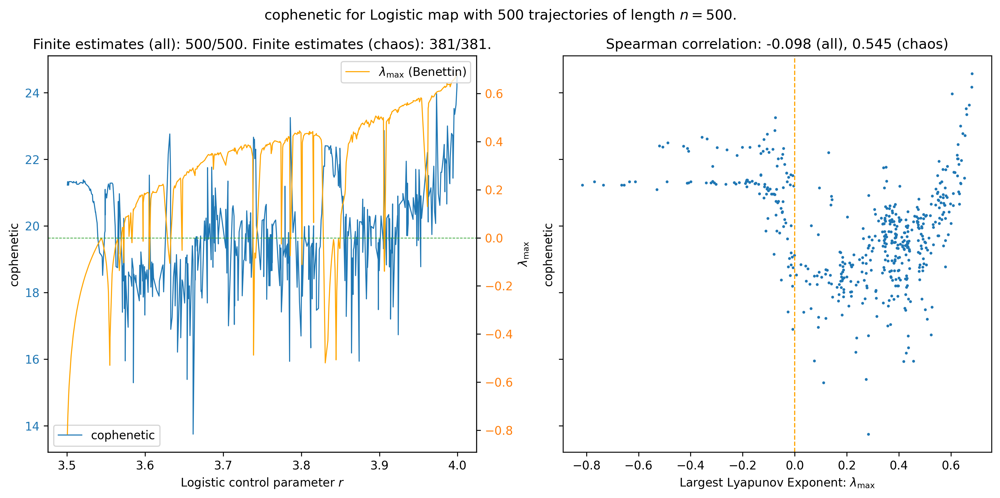

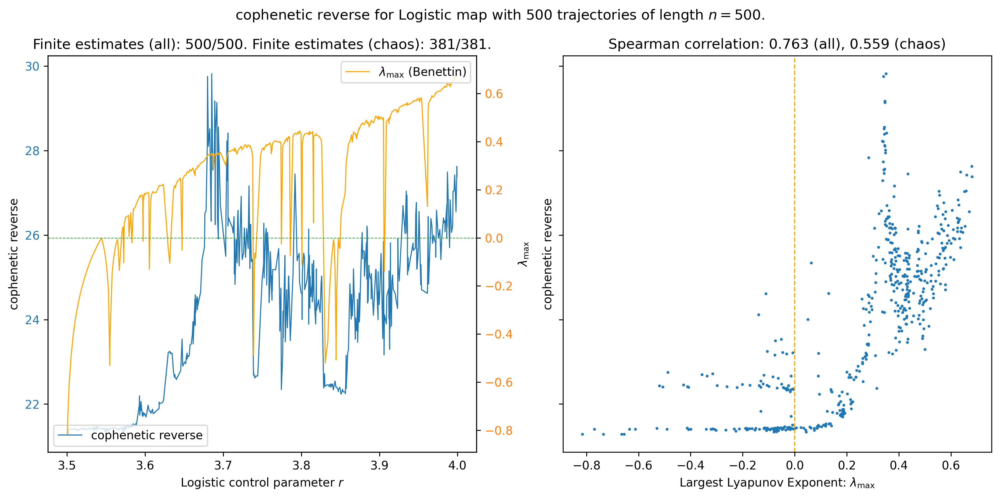

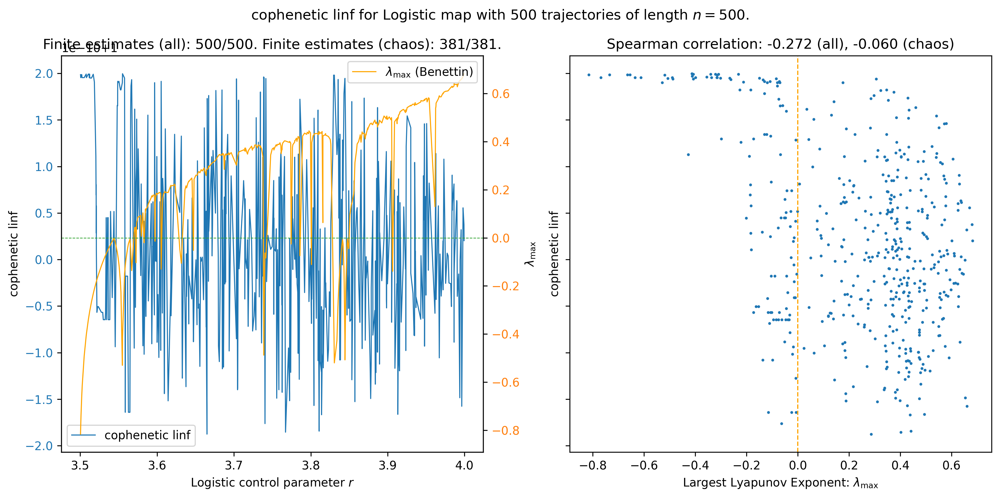

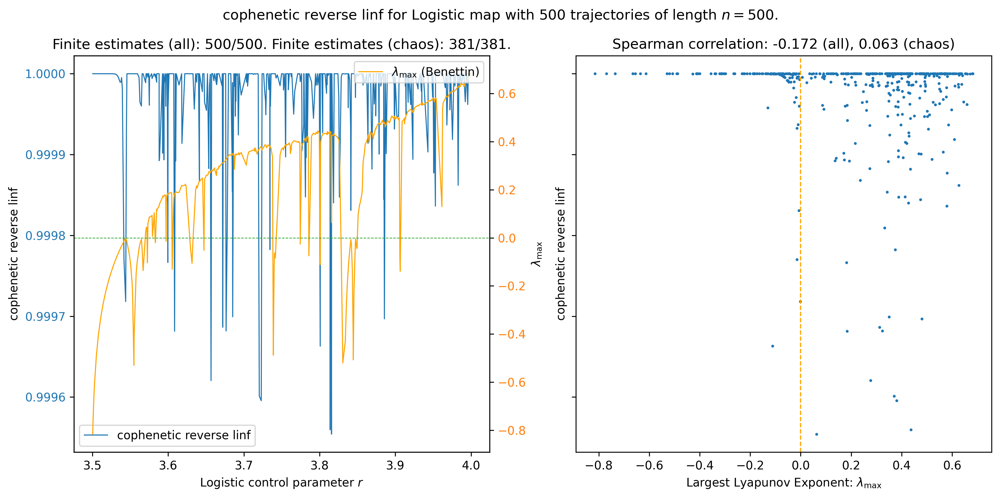

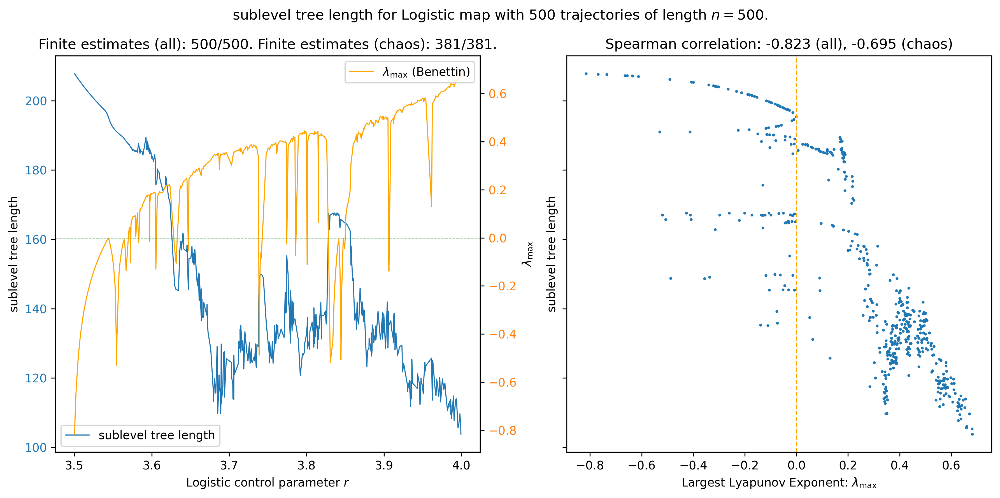

/Users/colin/miniconda3/envs/chaos-chapter/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/colin/miniconda3/envs/chaos-chapter/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


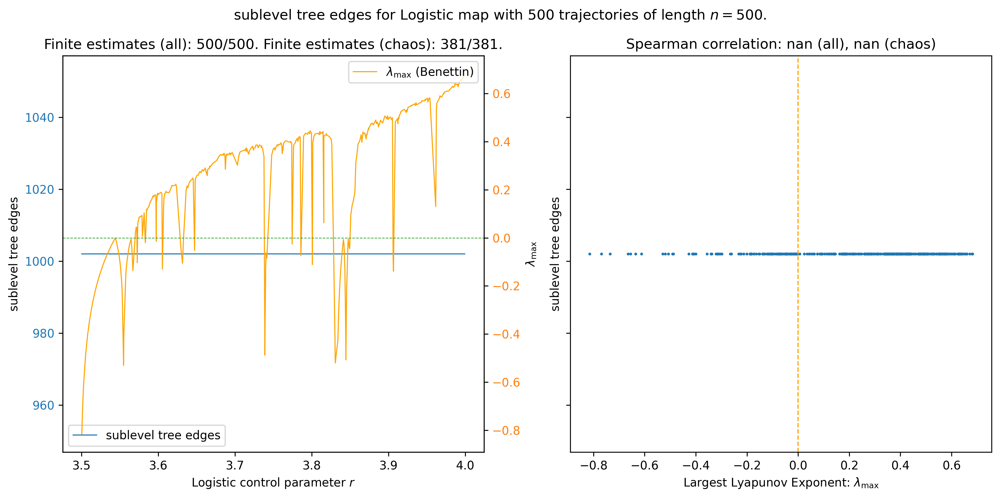

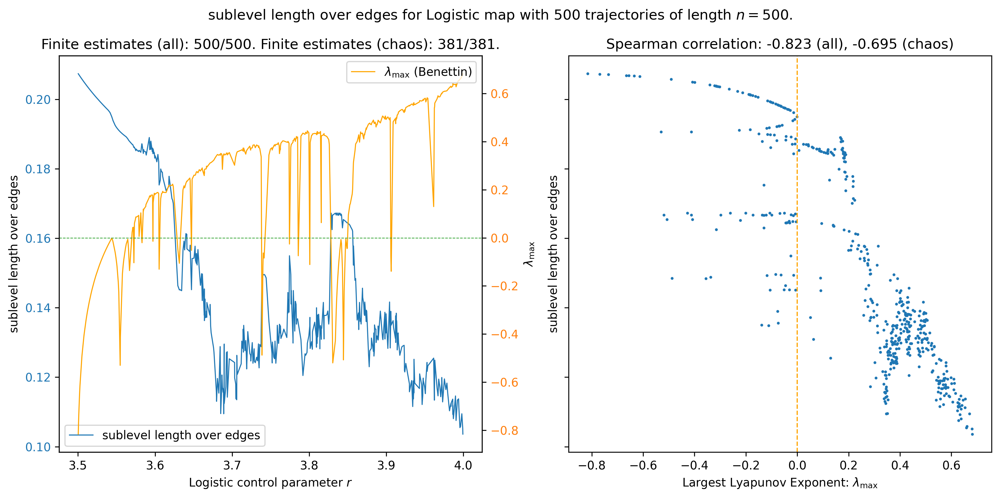

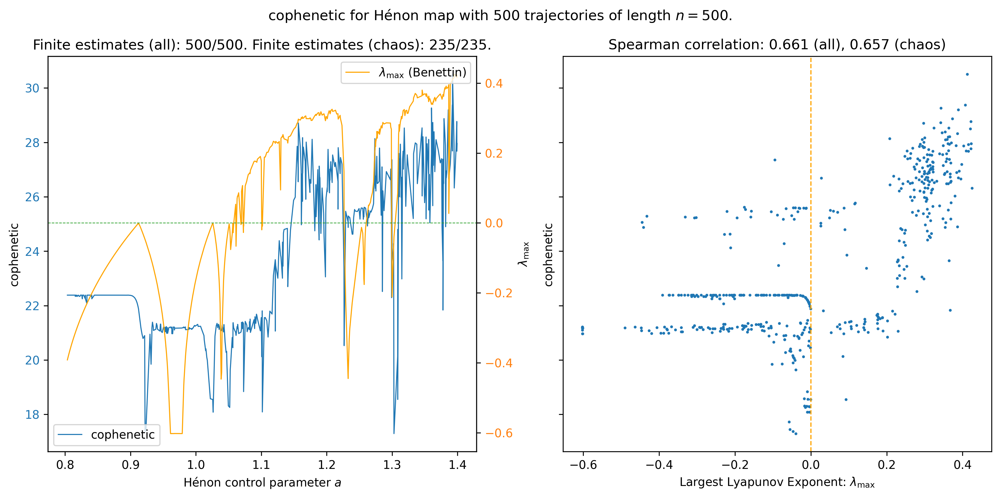

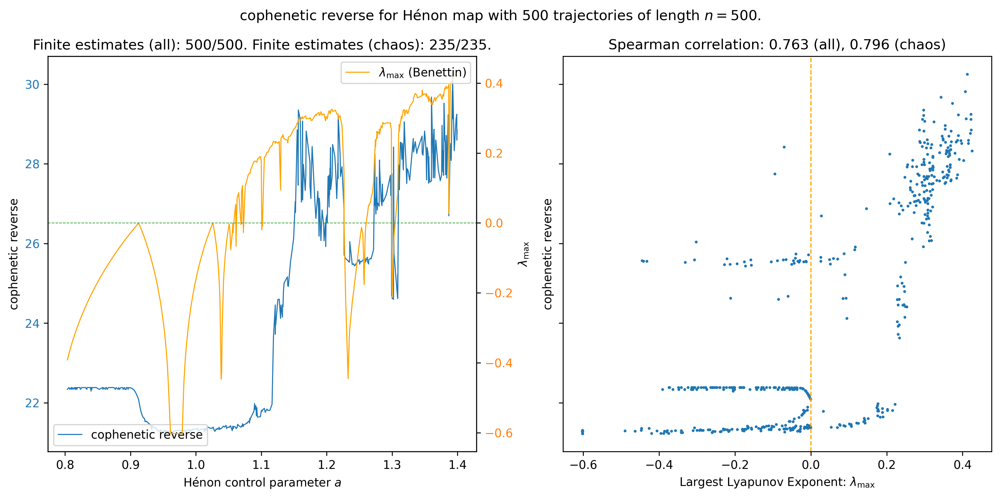

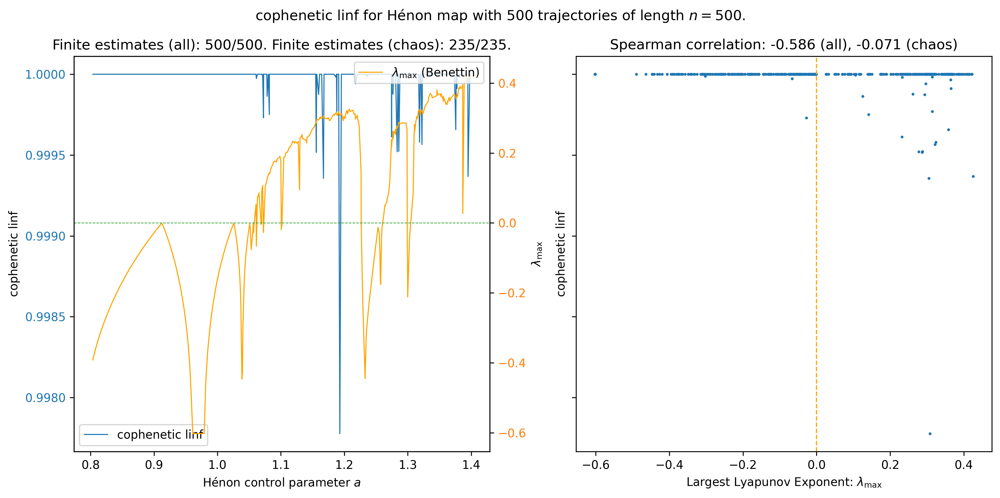

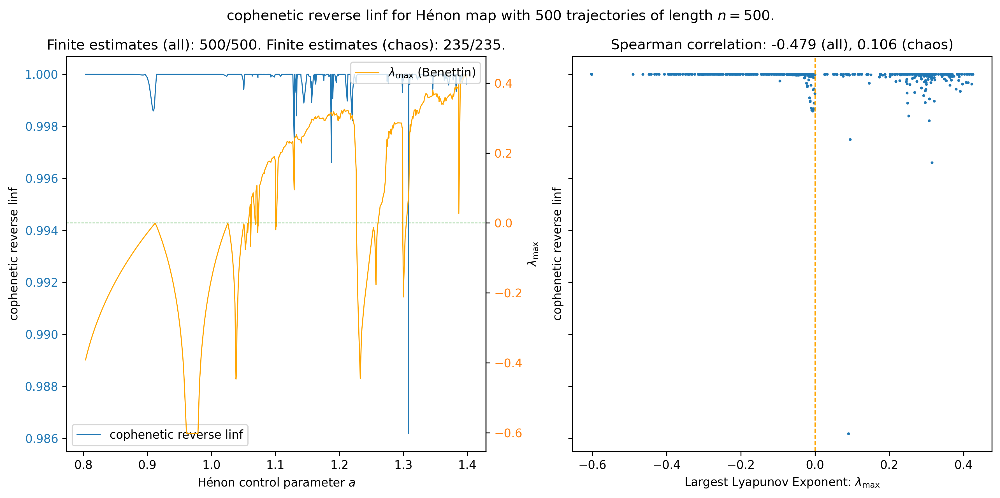

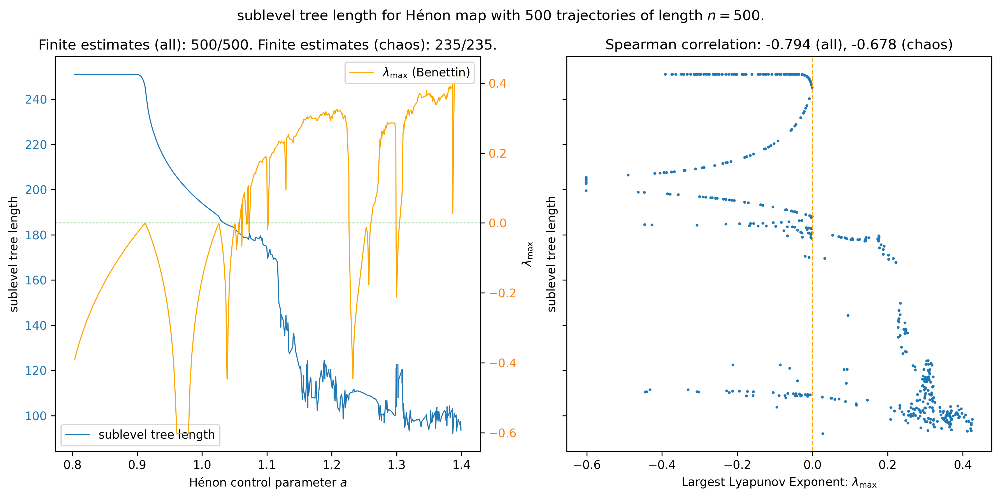

/Users/colin/miniconda3/envs/chaos-chapter/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/colin/miniconda3/envs/chaos-chapter/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


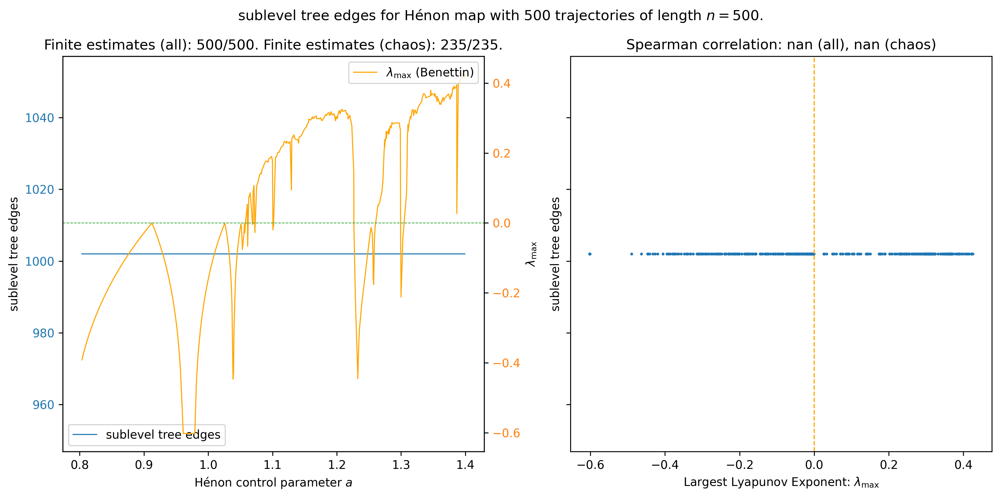

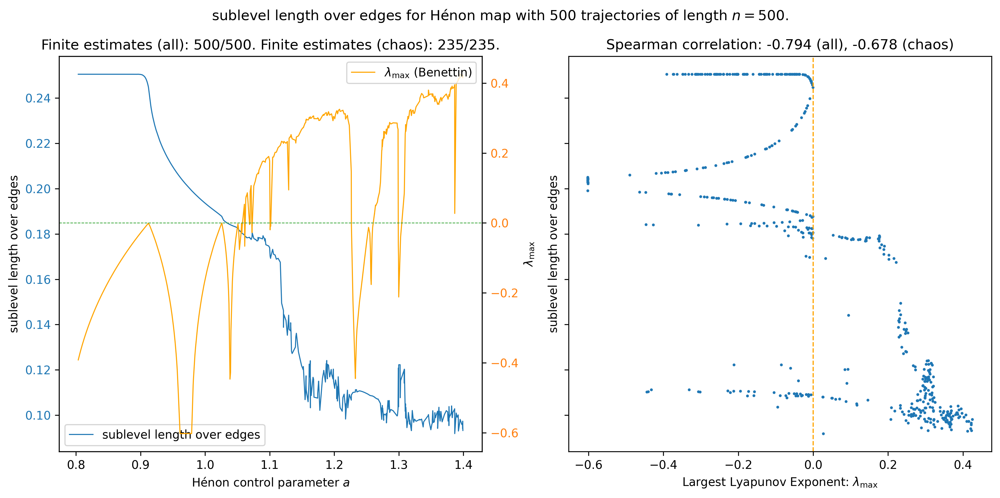

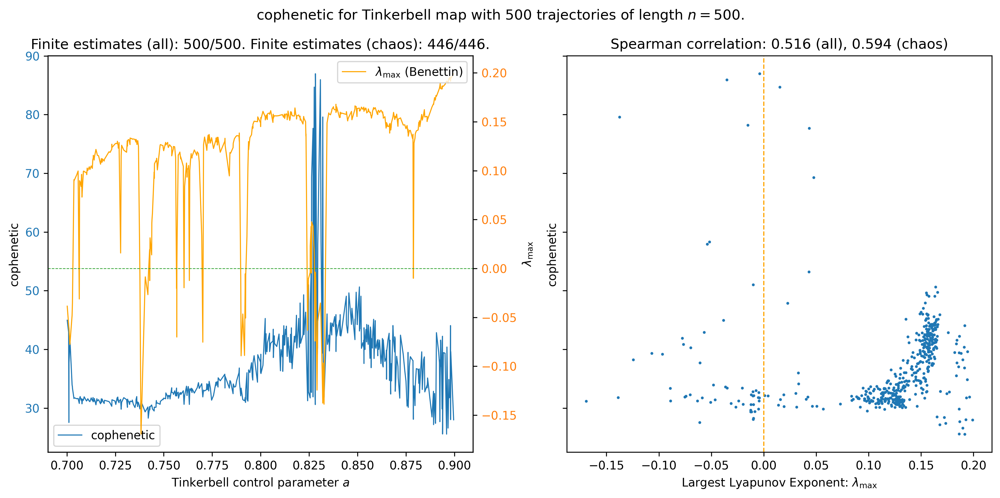

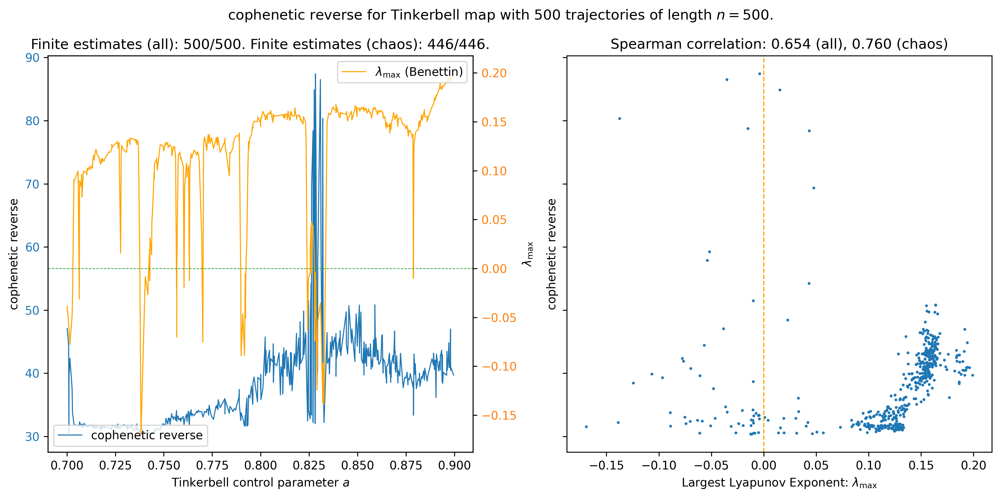

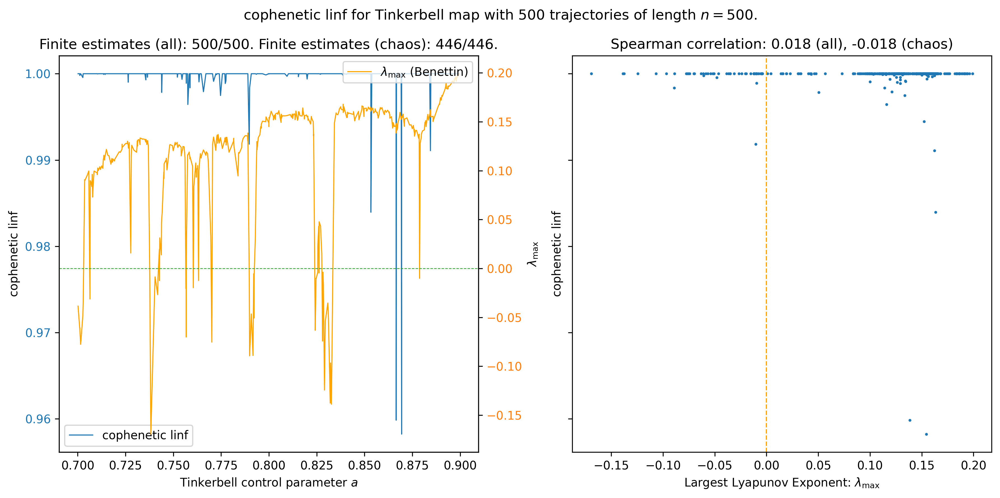

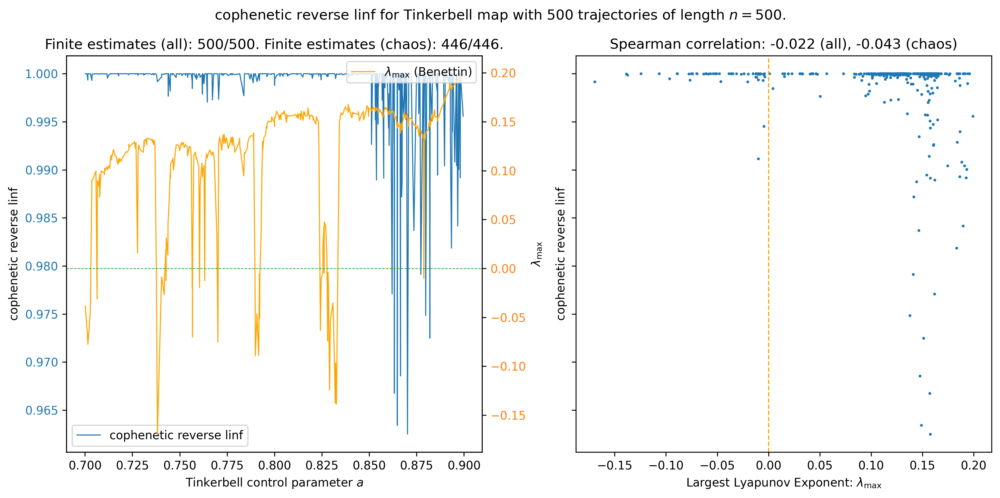

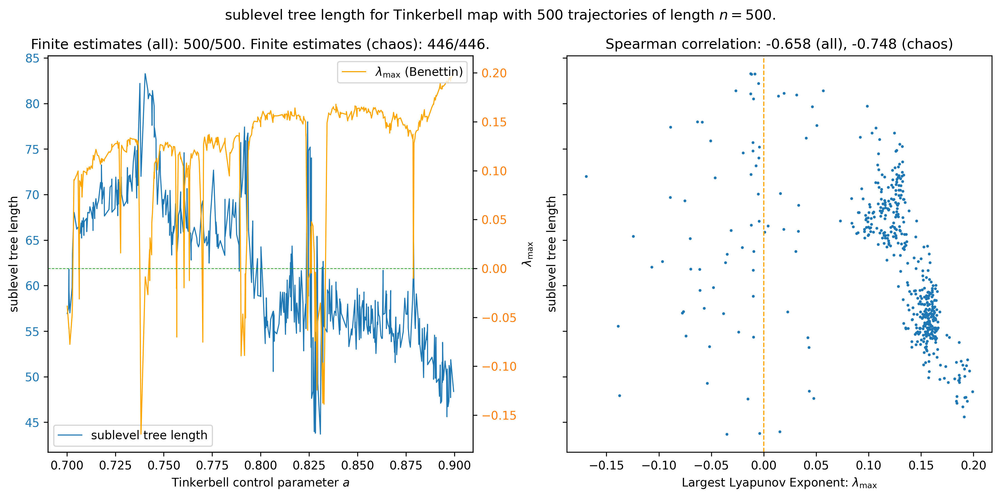

/Users/colin/miniconda3/envs/chaos-chapter/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/colin/miniconda3/envs/chaos-chapter/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


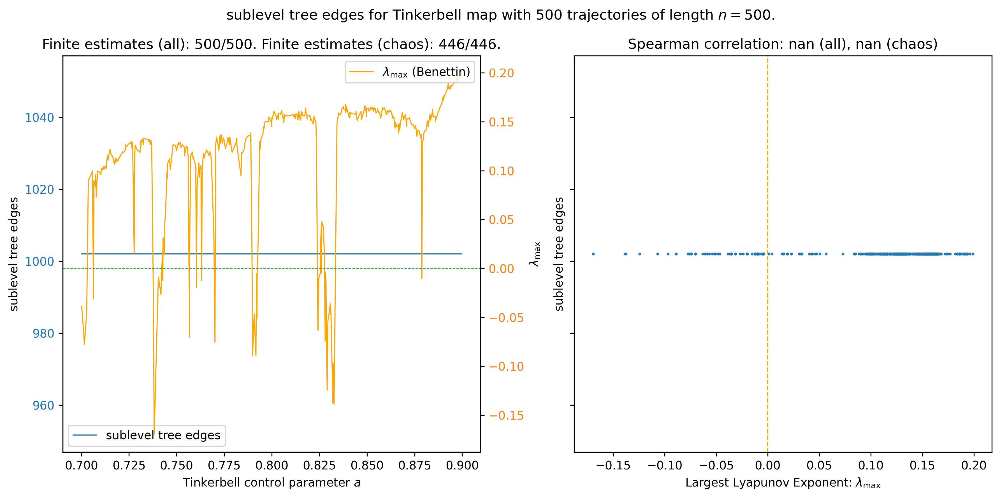

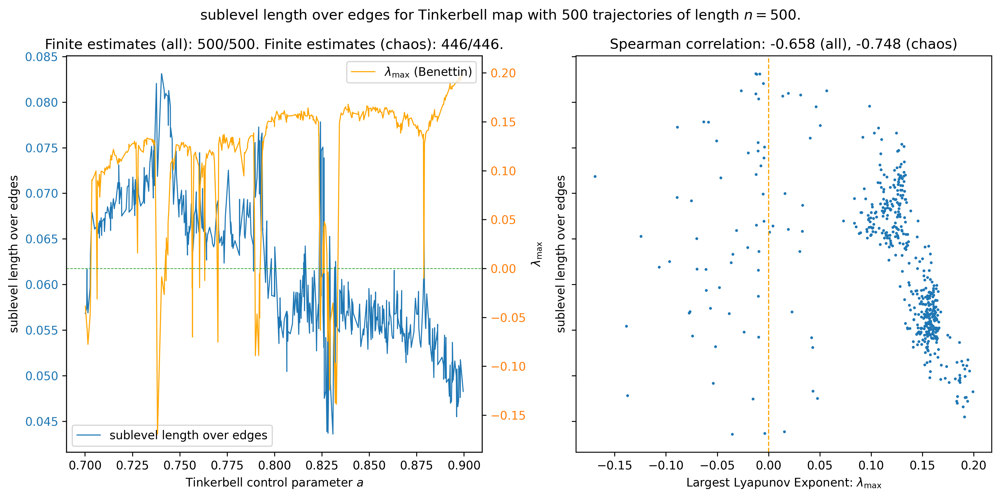

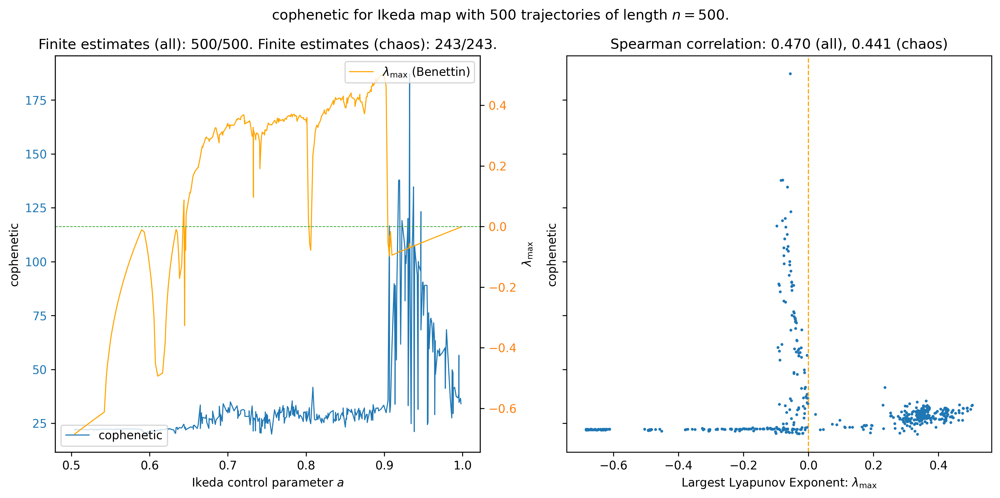

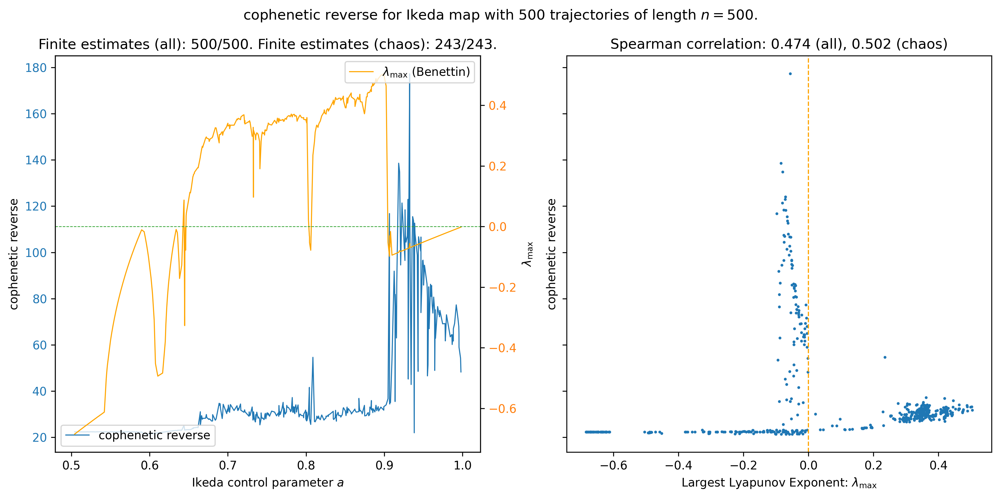

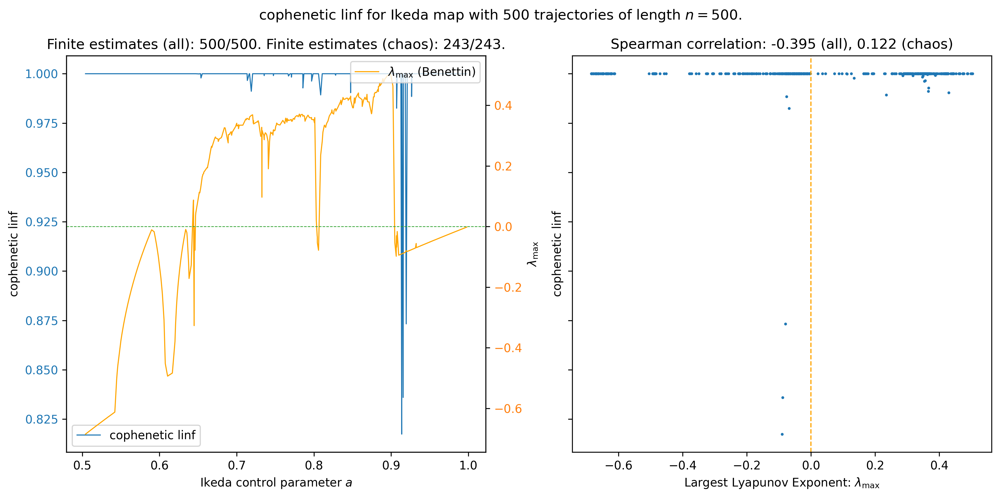

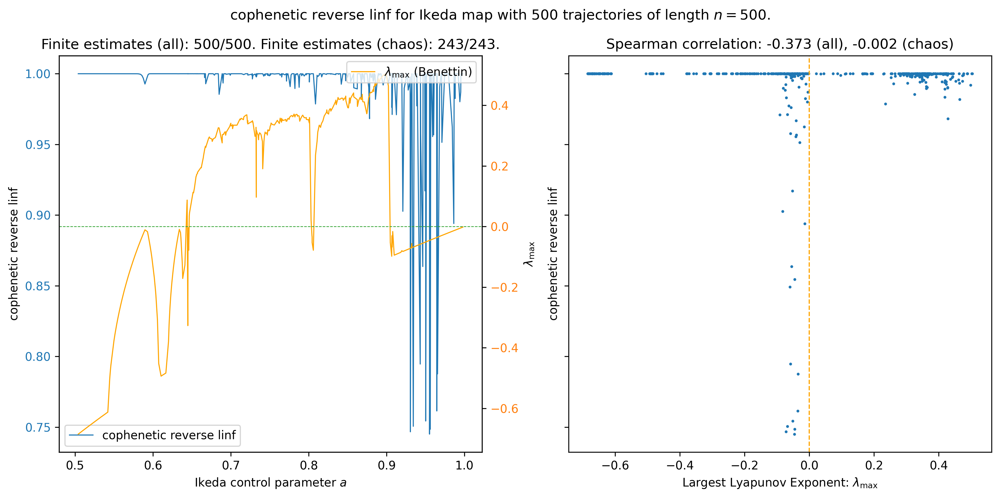

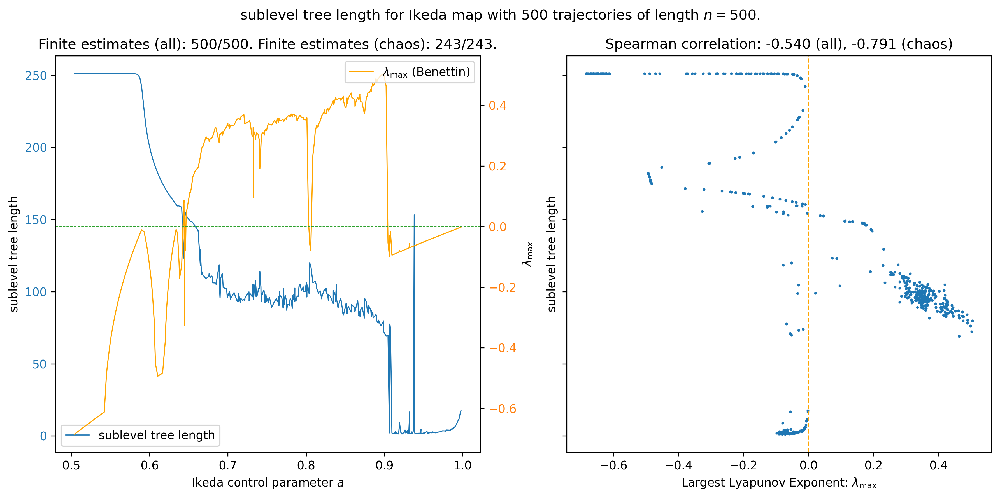

/Users/colin/miniconda3/envs/chaos-chapter/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4529: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(SpearmanRConstantInputWarning())
/Users/colin/miniconda3/envs/chaos-chapter/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4068: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


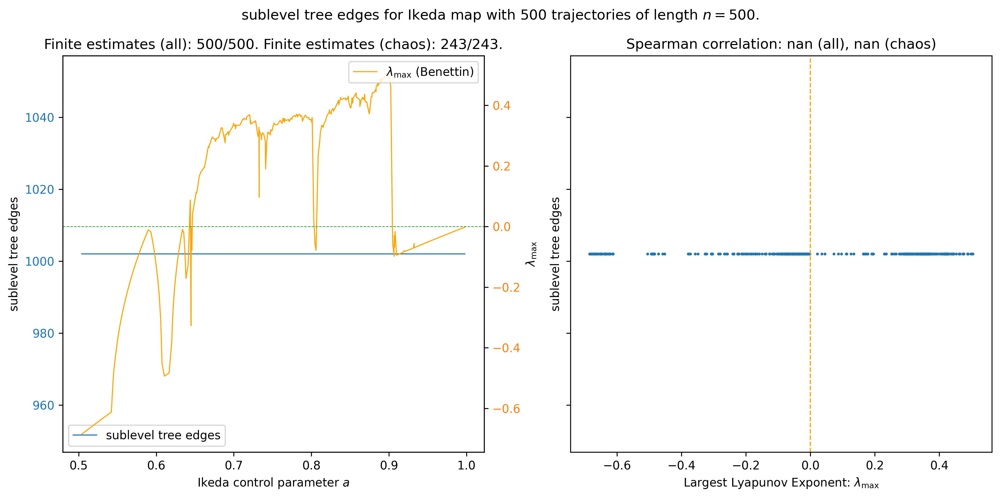

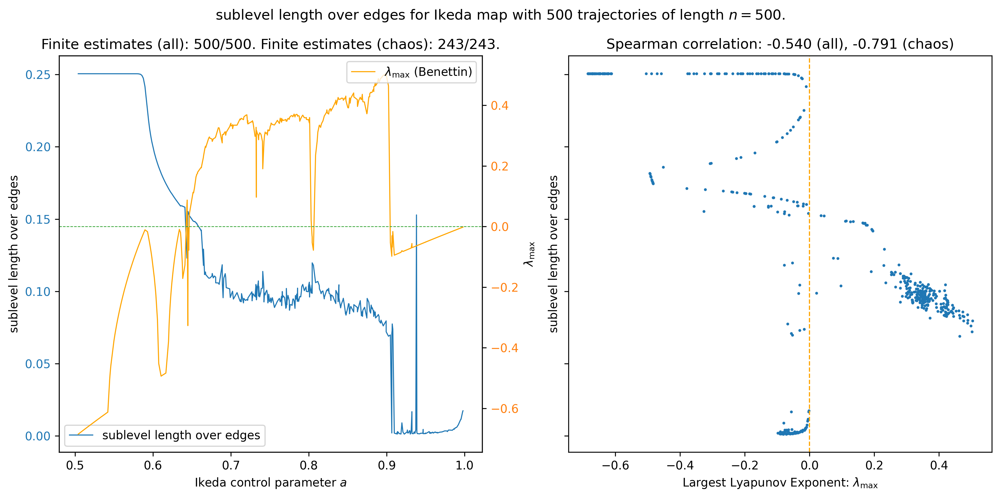

In [22]:
all_results_divergence_scores = {}
for sys_info in [
    ["Logistic", "r", logistic_trajectories, logistic_control_params, logistic_lces],
    ["Hénon", "a", henon_trajectories, henon_control_params, henon_lces],
    ["Tinkerbell", "a", tinkerbell_trajectories, tinkerbell_control_params, tinkerbell_lces],
    ["Ikeda", "a", ikeda_trajectories, ikeda_control_params, ikeda_lces],
]:
    all_results_divergence_scores |= generate_divergence_estimates(*sys_info)

In [14]:
# with open(f"outputs/data/PLMT_cophenetic_linf_divergences_{LENGTH}.pkl", "wb") as file:
#     pickle.dump(all_results_divergence_scores, file)


for result in all_results_divergence_scores:
    print(result, all_results_divergence_scores[result])

('cophenetic_length_linf', 'Logistic', 500) {'spearmanr': SpearmanrResult(correlation=0.8247057948231793, pvalue=2.3525728749119074e-125), 'pos_spearmanr': SpearmanrResult(correlation=0.6980624149729974, pvalue=6.134372341538907e-57), 'pearsonr': (0.8182124384013755, 8.371473410967469e-122), 'pos_pearsonr': (0.8218453833606602, 1.2302036888473851e-94), 'classification_f1': 0.8068256799829419, 'regression_neg_mean_absolute': -0.16562062342421466, 'pos_regression_neg_mean_absolute': -0.11405026113308195, 'regression_neg_mean_absolute_poly': -0.15720557557804155, 'pos_regression_neg_mean_absolute_poly': -0.10719800106218785}
('cophenetic_reverse_length_linf', 'Logistic', 500) {'spearmanr': SpearmanrResult(correlation=0.8247272029088116, pvalue=2.2887223139217323e-125), 'pos_spearmanr': SpearmanrResult(correlation=0.6981190453976388, pvalue=5.957207892134288e-57), 'pearsonr': (0.8182081091853822, 8.416314931735588e-122), 'pos_pearsonr': (0.821873932994436, 1.1969117259991641e-94), 'classif